In [53]:
import os
from datetime import datetime
import pandas as pd
import seaborn as sns
import numpy as np 
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

In [54]:
FILENAME = "./Data Ni Rack.xlsx"
ERROR_PROMPT = "Can't open an excel file"
pd.options.mode.chained_assignment = None

try:
	df = pd.read_excel(FILENAME)
except:
	print(ERROR_PROMPT)


In [55]:
df['Ni Current'] = df['Ni Current'].astype(int)
df['Cu Current'] = df['Cu Current'].astype(int)
df['PartQty'] = df['PartQty'].astype(int)
df['Cu Current_per_PartQty'] = df['Cu Current'] / df['PartQty']
df['Ni Current_per_PartQty'] = df['Ni Current'] / df['PartQty']

In [56]:
df.head(5)

,LocalTimeCol,LotNo,JobNo,PartNo,PartName,PartQty,LoadTime,SoakDip(min),EC1Volt,EC1Dip(min),...,Ni Volt,Ni pH,UnloadTime,SoakTemp,EC1Temp,EC2Temp,CuTemp,NiTemp,Cu Current_per_PartQty,Ni Current_per_PartQty
0,2025-08-01 17:52:52.887,96,25/080110,18,200018,117,1524,33,5.9,19,...,5.2,3.99,1755,54,56,56,45,54,1.102564,1.820513
1,2025-08-01 17:48:26.093,95,25/080110,18,200018,120,1520,33,5.9,18,...,5.7,3.99,1751,55,56,56,45,54,1.100000,1.825000
2,2025-08-01 17:44:14.013,94,25/080110,18,200018,124,1515,33,5.9,18,...,4.9,3.99,1746,55,56,56,45,54,1.104839,1.814516
3,2025-08-01 17:39:53.917,93,25/080110,18,200018,126,1511,32,5.9,18,...,5.4,3.99,1742,55,56,56,45,54,1.111111,1.825397
4,2025-08-01 17:35:37.037,92,25/080110,18,200018,126,1507,33,5.9,18,...,5.2,3.99,1738,55,56,56,45,54,1.111111,1.825397


In [57]:
df.min()

LocalTimeCol              2025-07-25 10:52:19.110000
LotNo                                              1
JobNo                                     25/071220 
PartNo                                            11
PartName                                  200018    
PartQty                                           12
LoadTime                                         831
SoakDip(min)                                    -225
EC1Volt                                          0.0
EC1Dip(min)                                       16
EC2Volt                                          0.0
EC2Dip(min)                                       18
CuDip(min)                                        16
Cu Current                                         6
Cu Volt                                          0.9
NiDip(min)                                        24
Ni Current                                        14
Ni Volt                                          1.8
Ni pH                                         

In [58]:
df.max()

LocalTimeCol              2025-08-01 17:52:52.887000
LotNo                                            140
JobNo                                     25/080125 
PartNo                                           983
PartName                                  SN9083B   
PartQty                                          279
LoadTime                                        1831
SoakDip(min)                                      35
EC1Volt                                          6.0
EC1Dip(min)                                       20
EC2Volt                                          5.9
EC2Dip(min)                                       21
CuDip(min)                                        19
Cu Current                                       180
Cu Volt                                          3.4
NiDip(min)                                        36
Ni Current                                       279
Ni Volt                                          7.0
Ni pH                                         

In [59]:
column_names = df.columns.tolist()
print(column_names)

['LocalTimeCol', 'LotNo', 'JobNo', 'PartNo', 'PartName', 'PartQty', 'LoadTime', 'SoakDip(min)', 'EC1Volt', 'EC1Dip(min)', 'EC2Volt', 'EC2Dip(min)', 'CuDip(min)', 'Cu Current', 'Cu Volt', 'NiDip(min)', 'Ni Current', 'Ni Volt', 'Ni pH', 'UnloadTime', 'SoakTemp', 'EC1Temp', 'EC2Temp', 'CuTemp', 'NiTemp', 'Cu Current_per_PartQty', 'Ni Current_per_PartQty']


<Axes: >

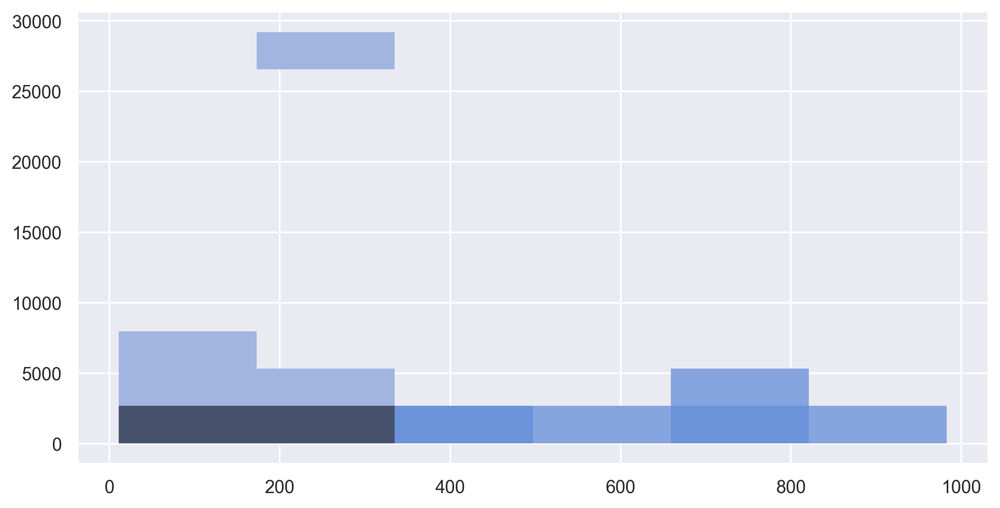

In [60]:

parts_no = df['PartNo'].unique()
parts_bin = []
for part in parts_no:
	parts_bin.append(df.loc[df['PartNo'] == part, 'PartQty'].sum())

sns.histplot(
	x = parts_no,
	y = parts_bin,
)

In [61]:
# sns.set_style("dark")
# sns.set_palette("husl")
# sns.color_palette("hls", 30)
# sns.color_palette("dark")

In [62]:
directory_name = "Graph_from_Bank"

try:
	os.mkdir(directory_name)
except FileExistsError:
    print(f"Directory '{directory_name}' already exists.")
except PermissionError:
    print(f"Permission denied: Unable to create '{directory_name}'.")
except Exception as e:
    print(f"An error occurred: {e}")
else:
    print(f"{directory_name} directory was successfully created !!!")

Directory 'Graph_from_Bank' already exists.


In [63]:
def plot_param_each_day(param, lim):
	PLATE_DATE = pd.to_datetime(df['LocalTimeCol']).dt.date.unique()
	UNITS_REPLACE = {
		'Volt' : ' ' + 'Voltage (V)',
		'Current' : ' ' + 'Current (A)',
		'Current_per_PartQty' : 'Current/PartQty (A/Piece)',
		'Temp' : ' ' + 'Temperature (°C)'
	}
	for day in PLATE_DATE:
		condition = (pd.to_datetime(df['LocalTimeCol']).dt.date == day)
		day_df = df[condition]
		sns.set_theme(rc={'figure.figsize':(10, 5)})
		ax = sns.scatterplot(
			data=day_df,
			x='LocalTimeCol',
			y=param,
			hue='PartNo',
			palette="bright",
			s=100,
		)
		sns.move_legend(
			ax, "upper left", bbox_to_anchor=(1, 1)
		)
		ax.set_title(f'{param} from {day}', fontdict={'fontsize':16})

		ax.set_ylim(lim[0], lim[1])

		y_label = param
		for key, unit in UNITS_REPLACE.items():
			if key in param:
				y_label = param.replace(key, unit)
		


		ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))
		ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
		ax.xaxis.set_label_text("Time")
		ax.yaxis.set_label_text(y_label)
		param_dir = f"{directory_name}/{param}"
		if not os.path.isdir(param_dir):
			os.mkdir(param_dir)
		file_name = f"{param}_{day}.png"
		file_path = f"{param_dir}/{file_name}"
		plt.savefig(file_path)
		plt.show()

In [64]:
all_params = {
	'EC1Volt' : [0, 7],
	'EC2Volt' : [0, 7], 
	'Cu Current_per_PartQty' : [0, 2.5], 
	'Cu Volt' : [0, 5], 
	'Ni Current_per_PartQty' : [0, 4], 
	'Ni Volt' : [0, 8], 
	'Ni pH' : [2, 5], 
	'SoakTemp' : [50, 60], 
	'EC1Temp': [45, 60], 
	'EC2Temp': [45, 60], 
	'CuTemp': [40, 50], 
	'NiTemp' : [45, 60]
}

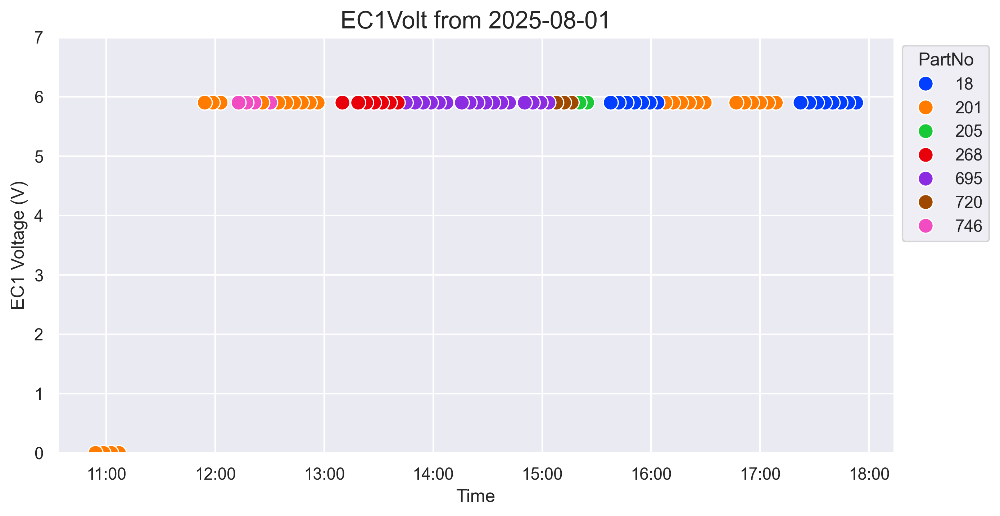

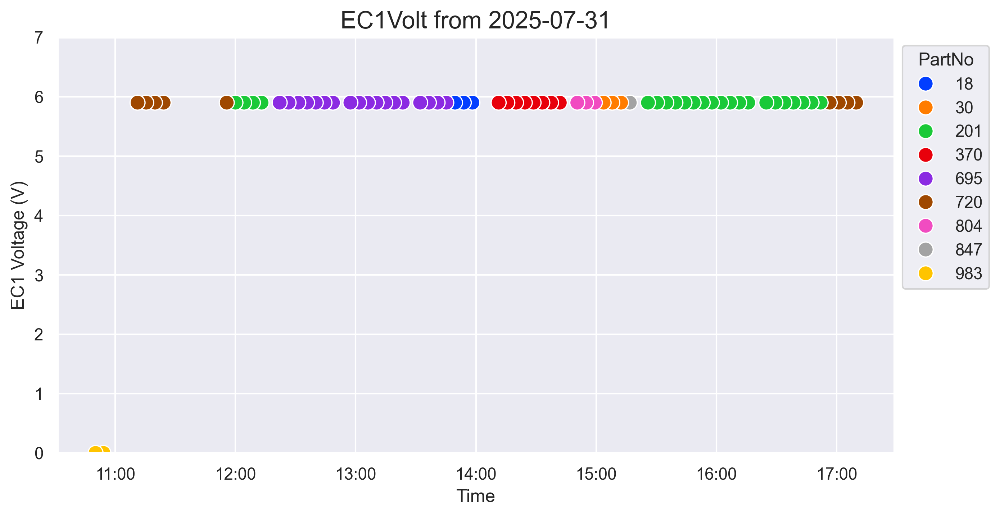

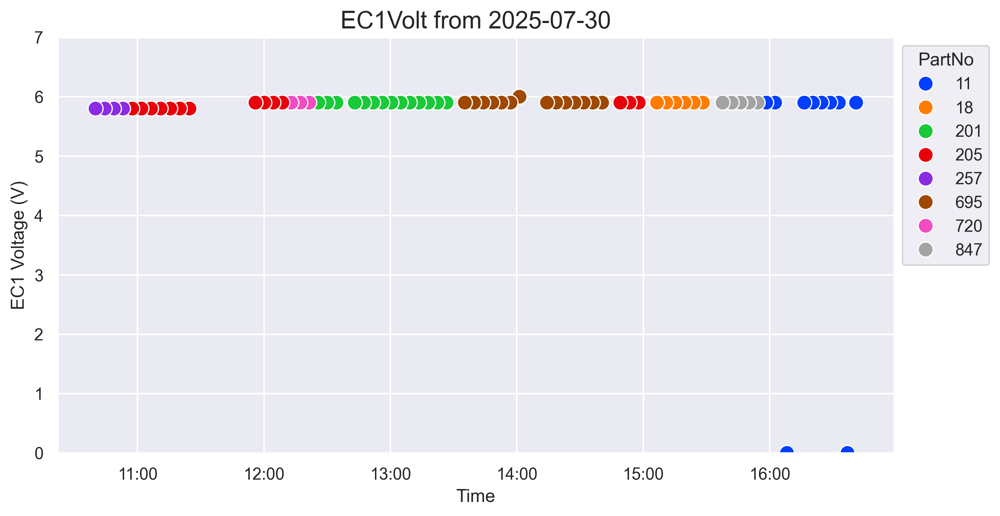

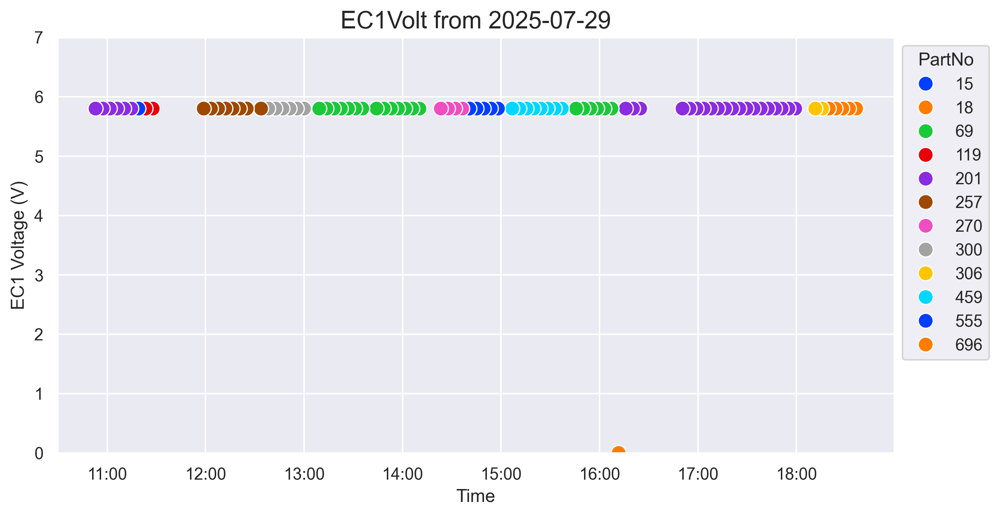

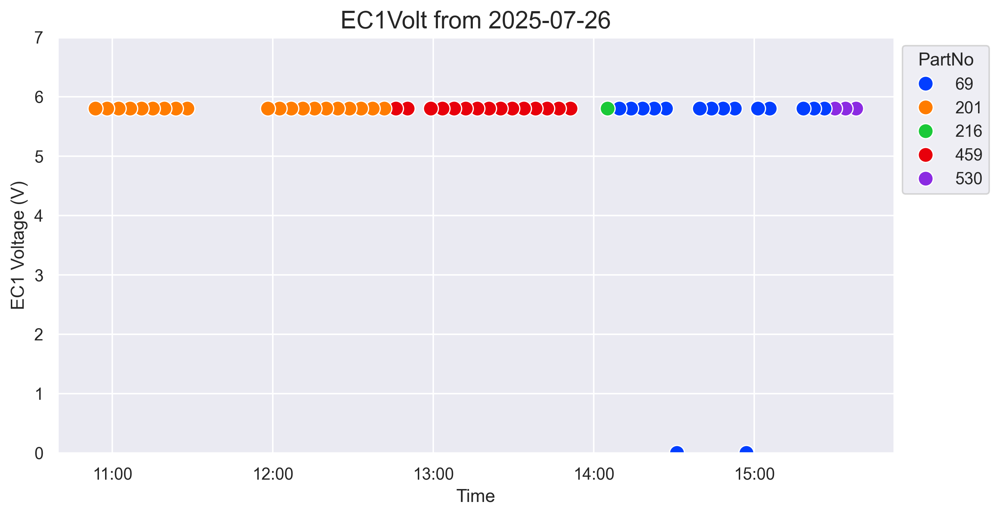

...

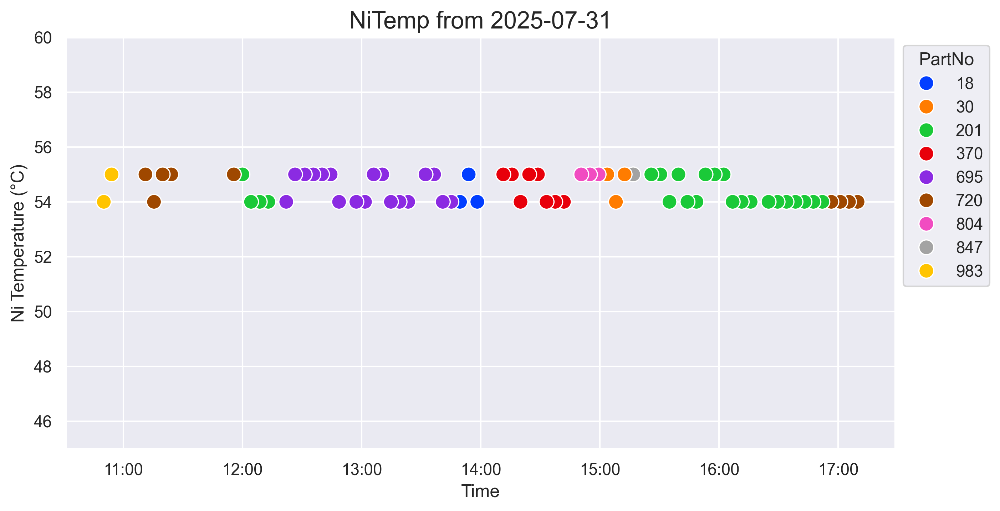

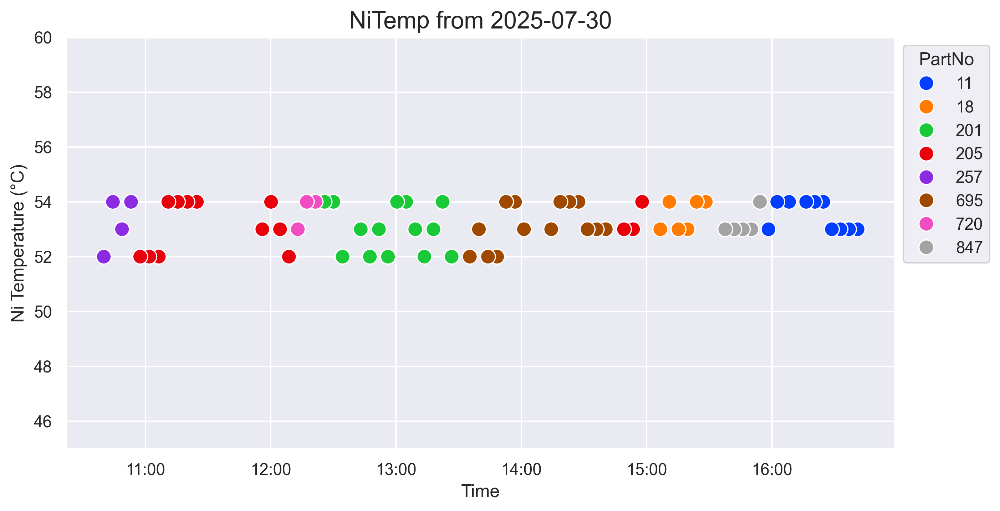

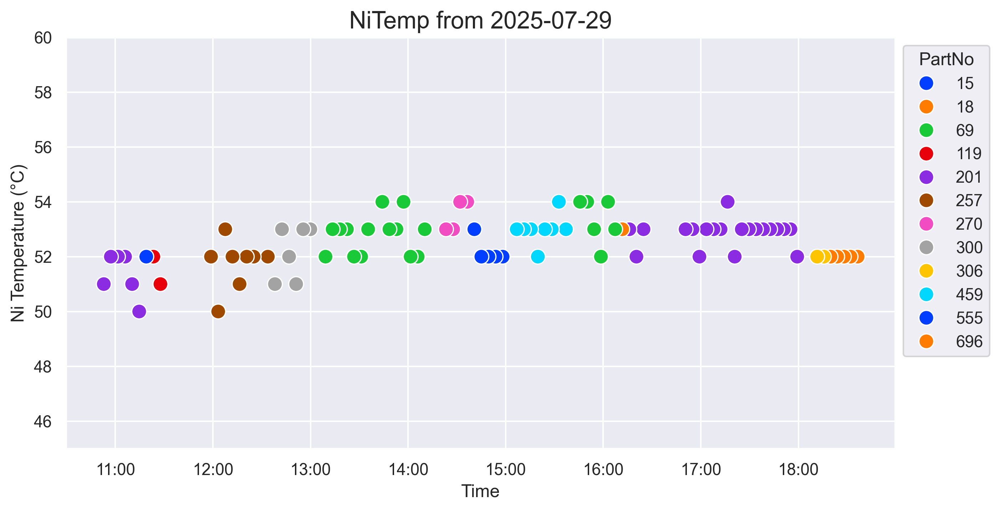

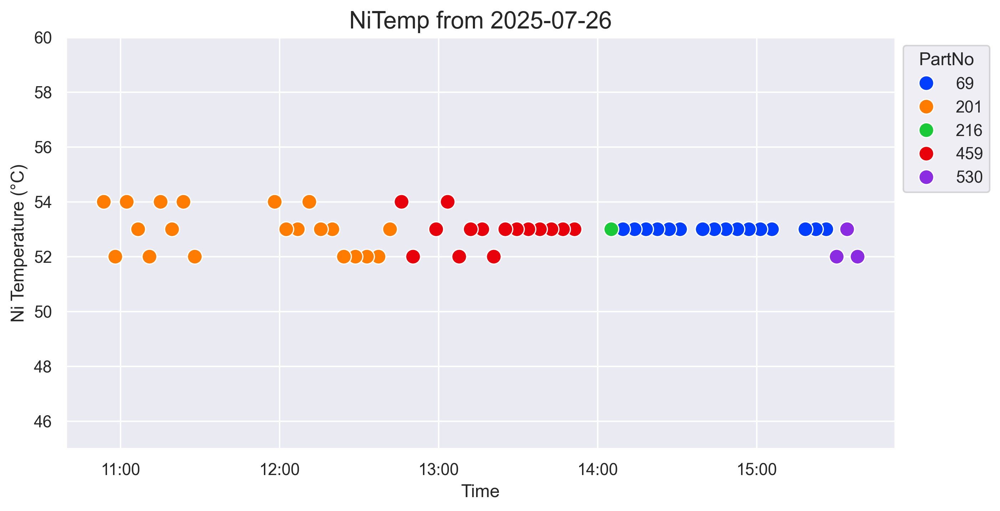

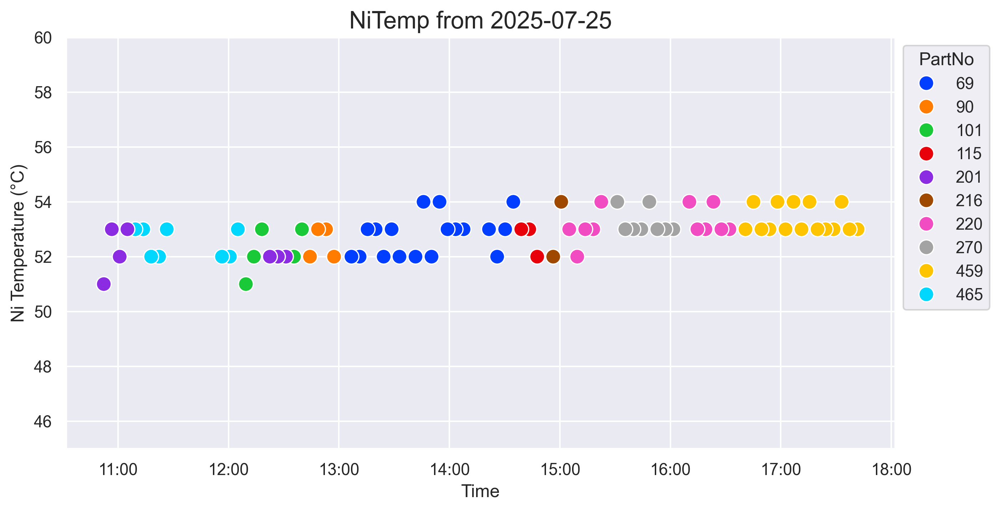

In [65]:
sns.set_theme(rc={"figure.dpi": 300})
for param, lim in all_params.items():
	plot_param_each_day(param, lim)